# Part - 2

# Accuracy And Explainability Of Auto-ML / DL Over Time-Series Data Implemented On A Weather Data Set

https://www.kaggle.com/datasets/mnassrib/jena-weather-dataset?resource=download&select=jena_weather_2004_2020.csv


Libraries used:

**1. Prophet : prophet 1.1.3 - !pip install prophet - (https://pypi.org/project/prophet/)**

**2. DarTS: darts 0.24.0 - !pip install darts - (https://pypi.org/project/darts/)**

**3. AutoTS : autots 0.5.6 - !pip install autots - (https://pypi.org/project/autots/)**

In [40]:
# pip install prophet==1.1.1

#### Current Working Directory

In [1]:
import os
from IPython.core.display import HTML
def create_link(path):
    path = os.path.abspath(path)
    url = path if os.path.isdir(path) else os.path.dirname(path)
    return f'<a href="" target="_blank">{path}</a>'
HTML(create_link(os.getcwd()))

In [42]:
# Execue to open the Working Directory
import os
os.system('explorer.exe .')

1

**Importing the required libraries**

In [2]:
import pandas as pd
import pandas_profiling as pp
from typing import Optional
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from darts import TimeSeries
from autots import AutoTS
from prophet import Prophet
import dataframe_image as dfi
import matplotlib.dates as mdates

import warnings
warnings.filterwarnings("ignore")

C:\Users\614074329\Anaconda3\envs\Thesis\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.

  warnings.warn(msg, NumbaDeprecationWarning)

C:\Users\614074329\Anaconda3\envs\Thesis\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

  def hasna(x: np.ndarray) -> bool:


## Some Helper Functions 

In [4]:
def show_df(df):
    """
    Display a DataFrame in a Jupyter notebook or print it otherwise. This function takes a DataFrame `df` as input and displays it using the `display()` function if the current environment is a Jupyter notebook, or prints it using the `print()` function otherwise.
    Parameters
    ----------
    df : (DataFrame) :  The input DataFrame to display or print.
    
    Returns : None

    Examples
    --------
    >>> data = pd.DataFrame({'A': [1, 2, 3], 'B': [4, 5, 6]})
    >>> show_df(data)
       A  B
    0  1  4
    1  2  5
    2  3  6
    """
    pd.set_option("display.max_columns",50)
    try:
        ipy = get_ipython()
        if 'IPKernelApp' not in ipy.config:
            raise ImportError("Not in IPython")
    except:
        # Not in a Jupyter notebook
        print(df)
    else:
        # In a Jupyter notebook
        from IPython.display import display
        display(df)

In [5]:
def sub_df(df,col_names):
    """
    Returns a subset of the input dataframe with only the specified columns.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input dataframe.
    col_names : list of str
        The list of column names to be included in the output dataframe.

    Returns:
    --------
    pandas.DataFrame
        A subset of the input dataframe with only the specified columns.
    """
    filtered_df = df[col_names]
    return filtered_df

### Load the data file into a pandas dataframe and check the basic information, such as shape, columns, data types etc.

We have 4 levels of aggregation performed on the original `10 minute granular` data, viz below, 
 - `aggregated_df_day` : Daily aggregate that is a average of Mean, Median and Mode of values for each day
 - `aggregated_df_hour` : Hourly aggregate that is a average of Mean, Median and Mode of values for each hour of the day
 - `aggregated_week_max` : Max value of each week from the source Data
 - `aggregated_month_max` : Max value of each month  from the source Data

We will be importing the `aggregated_month_max` for EDA and Plotting

In [6]:
aggregated_month_max = pd.read_csv("aggregated_month_max.csv")
show_df(aggregated_month_max.head(5))

,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-01,299.10,99.0,18.91,838.63,1691.12
1,2004-02-01,299.07,99.6,16.61,942.45,1895.75
2,2004-03-01,301.00,99.6,17.03,1092.15,2222.01
3,2004-04-01,302.96,99.4,17.40,1000.00,1967.18
4,2004-05-01,302.57,99.5,18.46,1037.42,2034.75


## Exploratory Data Analysis and Clean-Up

In [47]:
print("Shape of the Dataframe (rows, columns) = ", aggregated_month_max.shape, "\n")
show_df(aggregated_month_max.info())

Shape of the Dataframe (rows, columns) =  (204, 6) 



<class 'pandas.core.frame.DataFrame'>

RangeIndex: 204 entries, 0 to 203

Data columns (total 6 columns):

 #   Column           Non-Null Count  Dtype  

---  ------           --------------  -----  

 0   Date Time        204 non-null    object 

 1   Tpot (K)         204 non-null    float64

 2   rh (%)           204 non-null    float64

 3   H2OC (mmol/mol)  204 non-null    float64

 4   SWDR (W/m²)      204 non-null    float64

 5   PAR (µmol/m²/s)  204 non-null    float64

dtypes: float64(5), object(1)

memory usage: 9.7+ KB


None

In [48]:
print(aggregated_month_max['Date Time'].dtype)
aggregated_month_max['Date Time'] = pd.to_datetime(aggregated_month_max['Date Time'])
print(aggregated_month_max['Date Time'].dtype)

show_df(aggregated_month_max.head(5))

object

datetime64[ns]


,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-01,299.10,99.0,18.91,838.63,1691.12
1,2004-02-01,299.07,99.6,16.61,942.45,1895.75
2,2004-03-01,301.00,99.6,17.03,1092.15,2222.01
3,2004-04-01,302.96,99.4,17.40,1000.00,1967.18
4,2004-05-01,302.57,99.5,18.46,1037.42,2034.75


## EDA Plots

In [49]:
# create a copy of the DataFrame
df = aggregated_month_max.copy(deep = True)
show_df(df.head())

,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-01,299.10,99.0,18.91,838.63,1691.12
1,2004-02-01,299.07,99.6,16.61,942.45,1895.75
2,2004-03-01,301.00,99.6,17.03,1092.15,2222.01
3,2004-04-01,302.96,99.4,17.40,1000.00,1967.18
4,2004-05-01,302.57,99.5,18.46,1037.42,2034.75


<Figure size 3000x3000 with 0 Axes>

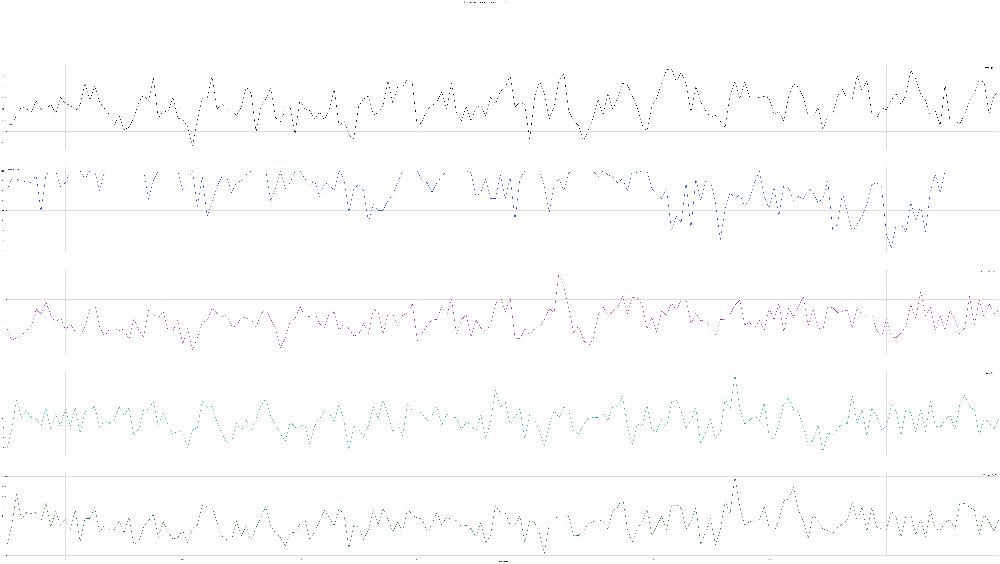

In [50]:
plt.figure(figsize=(30,30)) # set the figure size
df.plot(x="Date Time", figsize=(100,50), subplots=True)
plt.suptitle("Line plots of numerical columns over time") # add a title
plt.legend(loc="best") # add a legend
plt.savefig("line_plots.png") # save the figure
plt.show(block = False)

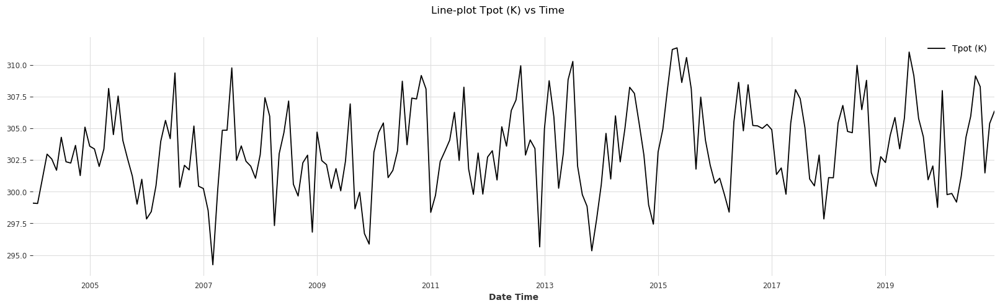

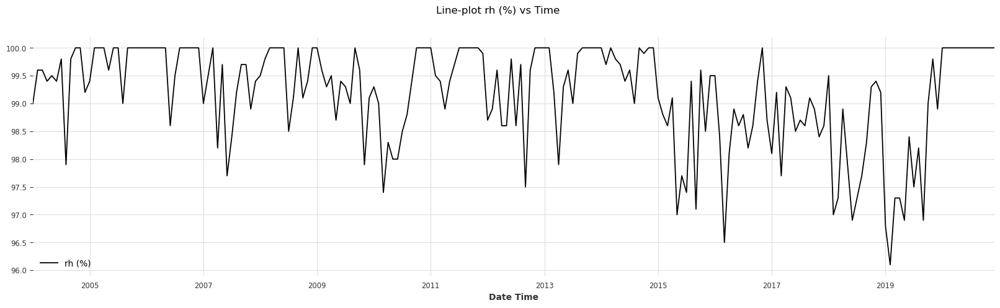

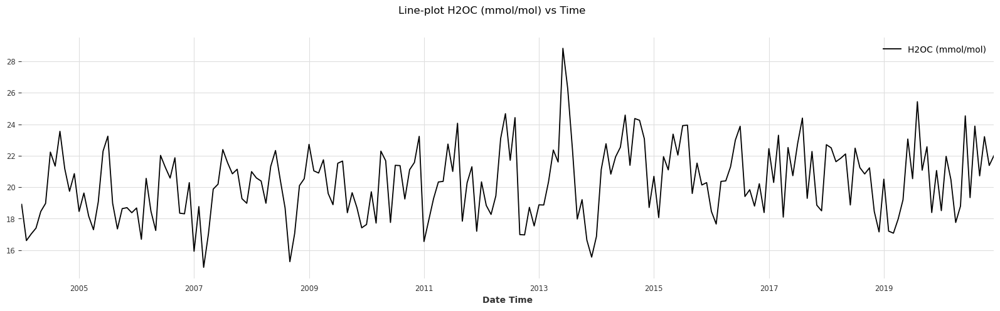

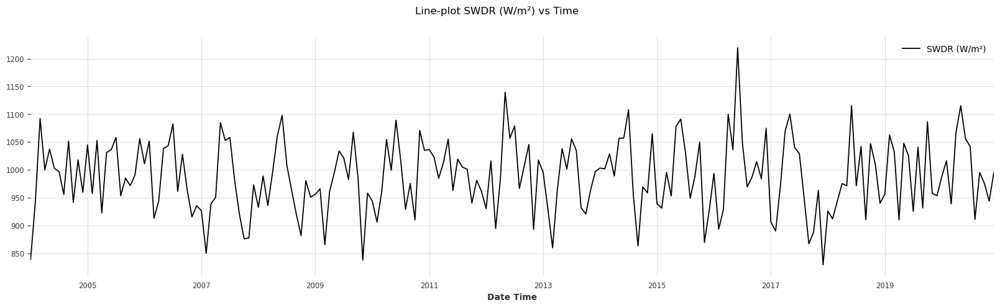

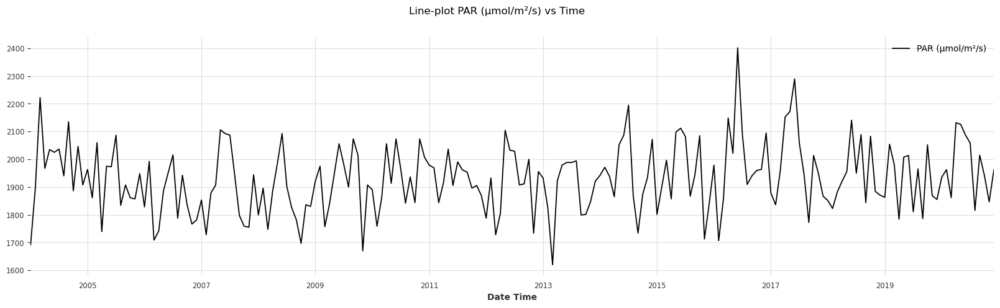

In [51]:
cols = [ each for each in df.columns if df[each].dtype in ['int64', 'float64']]
for col in cols:
    df.plot(x = "Date Time", y = col, figsize = (20, 5))
    plot_title = "Line-plot {} vs Time".format(col)
    plt.suptitle(plot_title) # add a title
    plt.legend(loc="best") # add a legend
    plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
    plt.show(block = False)
    print("")

### Outlier Detection

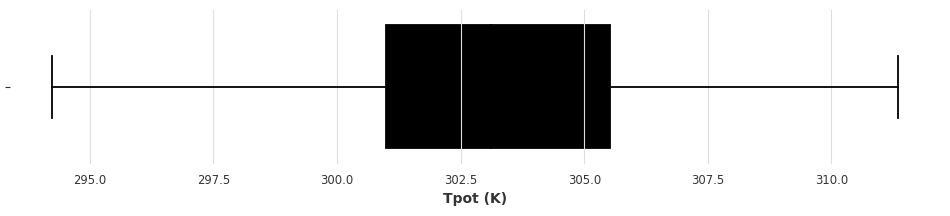

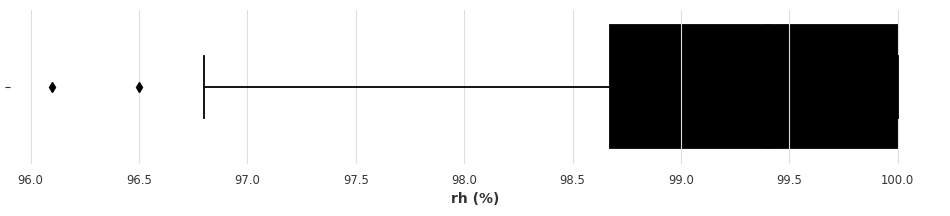

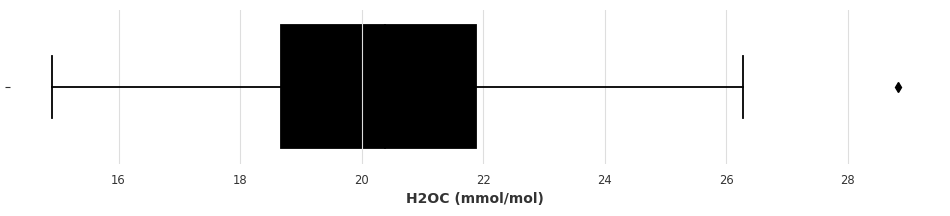

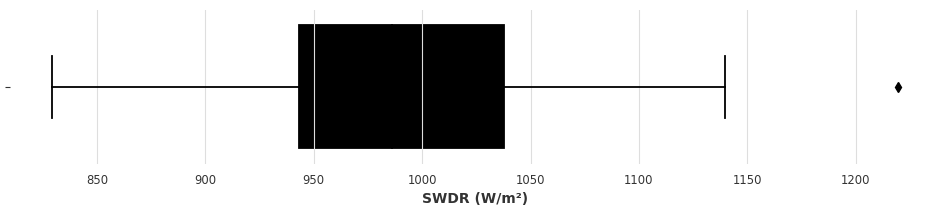

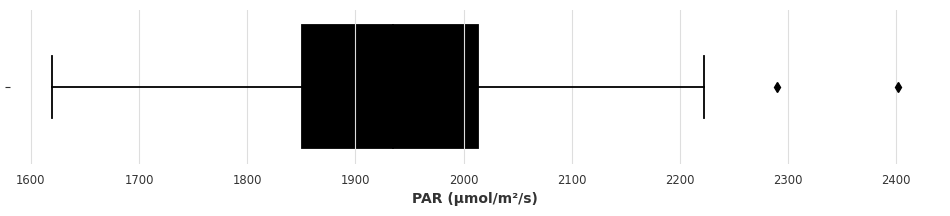

In [52]:
for col in df.columns:
    if df[col].dtype in ['int64', 'float64']:
        fig = plt.subplots(figsize=(12,2))
        ax = sns.boxplot(x=df[col], whis=1.5)
        plt.show()

While we use the Box Plots to check for outliers and use the Inter Quartile Range with a Whisker at 1.5 marker, we see that most of the parameters seem to have outliers.

However, examining carefully shows that these actually aren't outliers as the variance between these values and the values within the IQR is not huge. 

Example: The Temperatures below -15degC are outside the IQR. However it is common knowledge that this is possible and the temperatures can drop way below -15 in the winters. 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


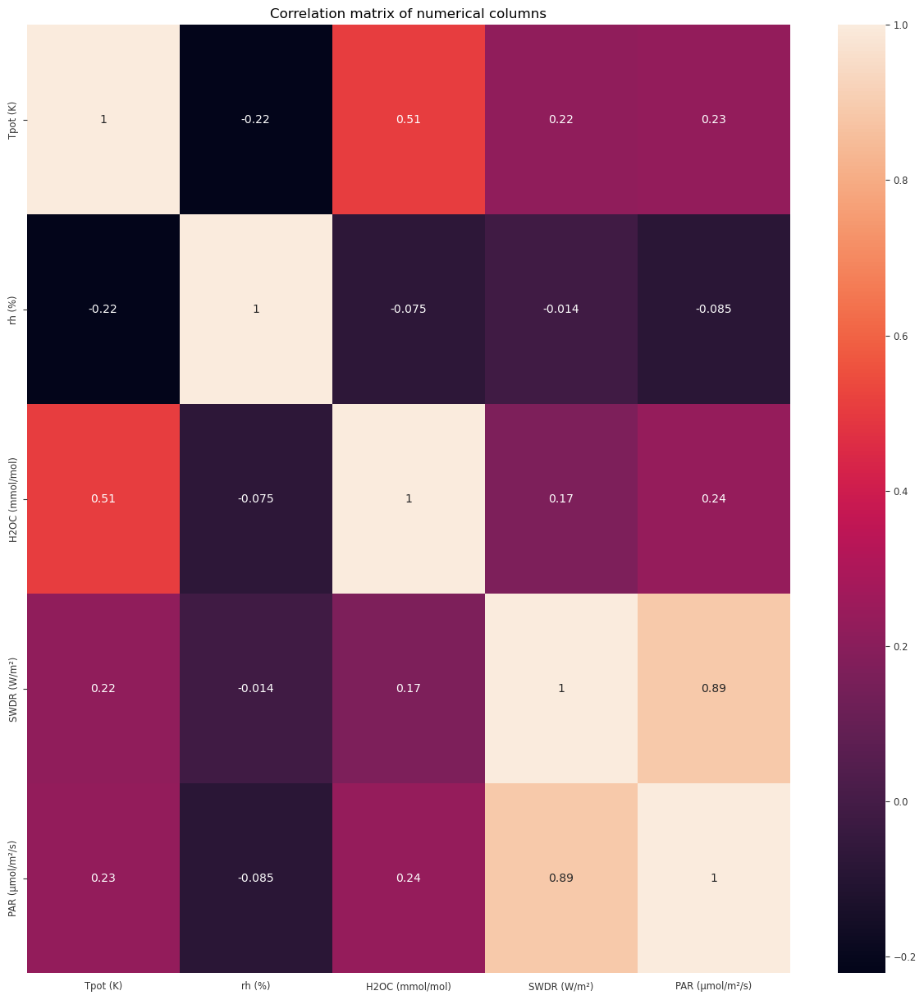

In [53]:
corr = df.corr()
plt.figure(figsize=(15,15)) # set the figure size
sns.heatmap(corr, annot=True)
plt.title("Correlation matrix of numerical columns") # add a title
plt.legend(loc="best") # add a legend
plt.savefig("Correlation matrix of numerical columns.png") # save the figure
plt.show()

## Time Series Decomposition. 

There are two ways in which the time series data can be decomposed:

 **Additive Seasonal Decomposition - the individual components can be added to get the time-series data**
 
 **Multiplicative Seasonal Decomposition - the individual components can be multiplied to get the time-series data**

### Additive Seasonal Decomposition

In [54]:
from pylab import rcParams
import statsmodels.api as sm
from typing import Optional

In [55]:
def additive_seasonal_decomposition(df: pd.DataFrame, freq: str, datetime_col: Optional[str] = None):
    """
    Generates Additive Seasonal Decomposition plots for all the Numeric columns in the supplied DataFrame.
    
    :param df: Input DataFrame
    :type df: pd.DataFrame
    :param freq: The Datetime frequency of the Dataframe. accepts a host of values like below. 
                 https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases
    :type freq: str
    :param datetime_col: Name of the datetime column, defaults to None
    :type datetime_col: Optional[str], optional
    :return: Aggregated DataFrame
    :rtype: pd.DataFrame
    """
    
    # Check if the DataFrame already has a datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        # If not, find the datetime column by itself if not provided
        if datetime_col is None:
            for col in df.columns:
                if pd.api.types.is_datetime64_any_dtype(df[col]):
                    datetime_col = col
                    break

        # Raise an error if no datetime column is found
        if datetime_col is None:
            raise ValueError("No datetime column found in the DataFrame")

        # Convert the datetime column to a datetime object and set it as the index of the DataFrame
        df[datetime_col] = pd.to_datetime(df[datetime_col])
        df.set_index(datetime_col, inplace=True)
        
    # Sorting the index and declaring the index frequency    
    df = df.sort_index()
    df.index.freq = freq
    
    #Generating the Additional Seasonal Decomposition PLots for each of the Numeric columns in the supplied DataFrame
    for col in df.columns:
        if df[col].dtype in ['int64', 'float64']:
            rcParams['figure.figsize'] = 60,20
            decomposition = sm.tsa.seasonal_decompose(df[col], model = 'additive')
            fig = decomposition.plot()
            plot_title = "{} - Additive Decomposition of {}".format(freq, col)
            plt.suptitle(plot_title) # add a title
            plt.legend(loc="best") # add a legend
            plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
            plt.show(block = False)
            print("---------------------------------------------------------------------------------------------------------")
    

### Plotting Additive Seasonal Decomposition of data at `aggregated_month_max` frequency

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


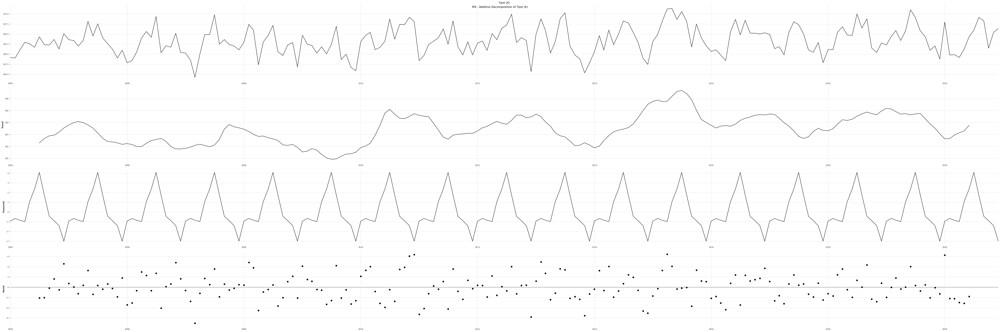

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


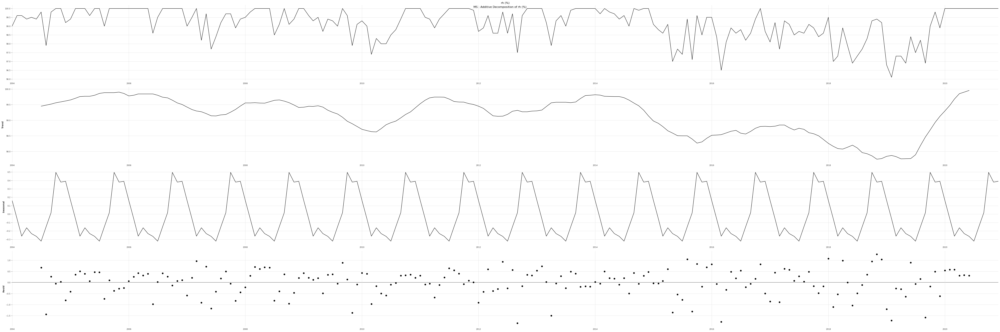

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


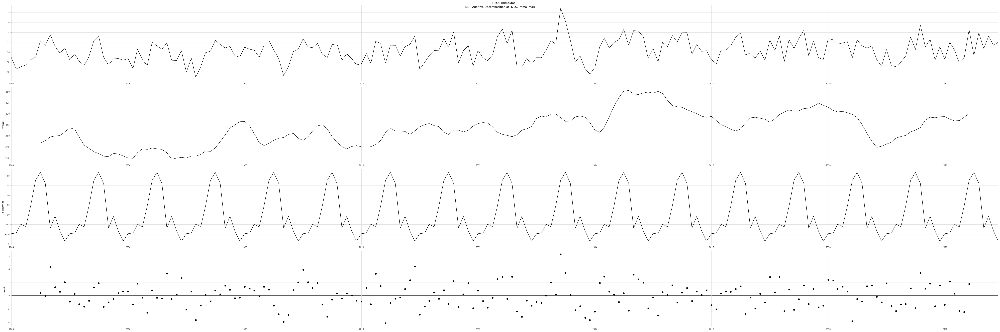

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


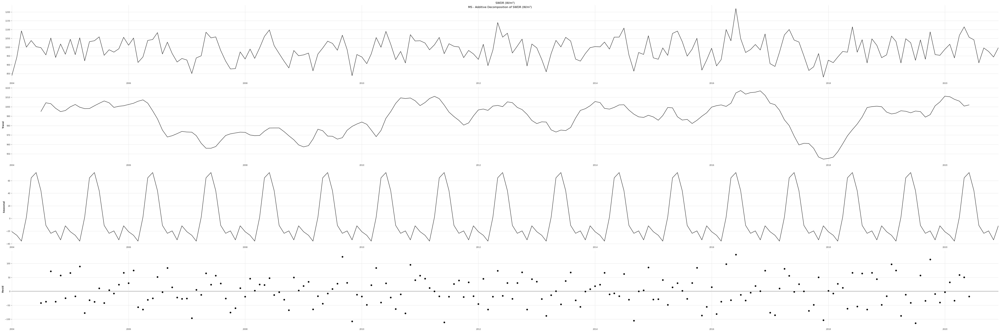

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


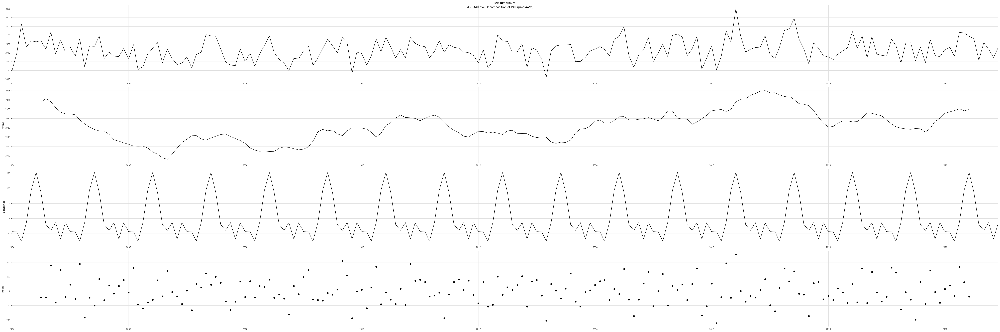

---------------------------------------------------------------------------------------------------------


In [56]:
additive_seasonal_decomposition(df = df, freq = "MS", datetime_col = "Date Time")

In [57]:
aggregated_month_max.head()

,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-01,299.10,99.0,18.91,838.63,1691.12
1,2004-02-01,299.07,99.6,16.61,942.45,1895.75
2,2004-03-01,301.00,99.6,17.03,1092.15,2222.01
3,2004-04-01,302.96,99.4,17.40,1000.00,1967.18
4,2004-05-01,302.57,99.5,18.46,1037.42,2034.75


### Multiplicative Seasonal Decomposition

In [58]:
def multiplicative_seasonal_decomposition(df: pd.DataFrame, freq: str, datetime_col: Optional[str] = None):
    """
    Generates Multiplicative Seasonal Decomposition plots for all the Numeric columns in the supplied DataFrame.
    
    :param df: Input DataFrame
    :type df: pd.DataFrame
    :param freq: The Datetime frequency of the Dataframe. accepts a host of values like below. 
                 https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases
    :type freq: str
    :param datetime_col: Name of the datetime column, defaults to None
    :type datetime_col: Optional[str], optional
    :return: Aggregated DataFrame
    :rtype: pd.DataFrame
    """
    
    # Check if the DataFrame already has a datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        # If not, find the datetime column by itself if not provided
        if datetime_col is None:
            for col in df.columns:
                if pd.api.types.is_datetime64_any_dtype(df[col]):
                    datetime_col = col
                    break

        # Raise an error if no datetime column is found
        if datetime_col is None:
            raise ValueError("No datetime column found in the DataFrame")

        # Convert the datetime column to a datetime object and set it as the index of the DataFrame
        df[datetime_col] = pd.to_datetime(df[datetime_col])
        df.set_index(datetime_col, inplace=True)
        
    # Sorting the index and declaring the index frequency    
    df = df.sort_index()
    df.index.freq = freq
    
    #Generating the Multiplicative Seasonal Decomposition PLots for each of the Numeric columns in the supplied DataFrame
    for col in df.columns:
        if df[col].dtype in ['int64', 'float64']:
            rcParams['figure.figsize'] = 60,20
            decomposition = sm.tsa.seasonal_decompose(df[col], model = 'multiplicative')
            fig = decomposition.plot()
            plot_title = "{} - Multiplicative Decomposition of {}".format(freq, col)
            plt.suptitle(plot_title) # add a title
            plt.legend(loc="best") # add a legend
            plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
            plt.show(block = False)
            print("---------------------------------------------------------------------------------------------------------")
    

- Since our data has `Zero` and `Negative` values, we will `not` be `using` `Multiplicative Seasonal Decompose`.
- Also if we closely observe, the `Additive Seasonal Decompose` `captures the trend` pretty much appropriatley. 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


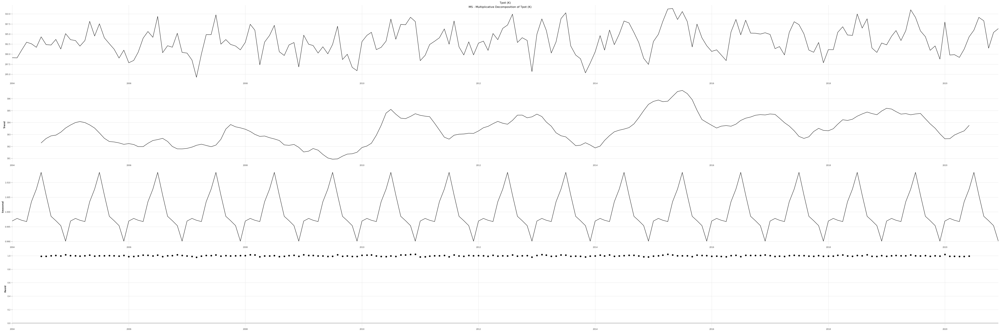

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


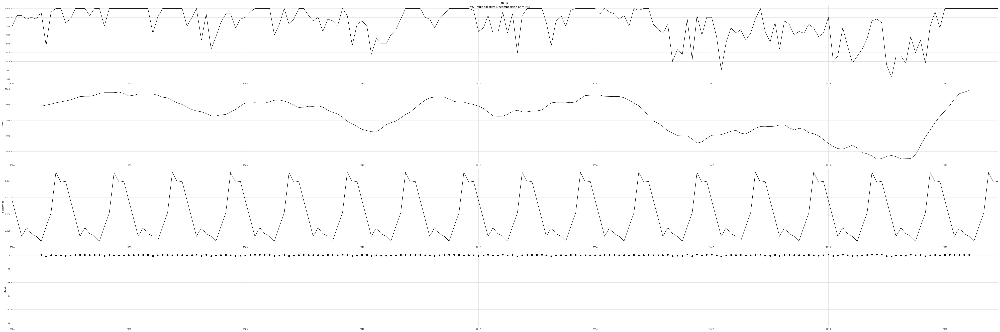

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


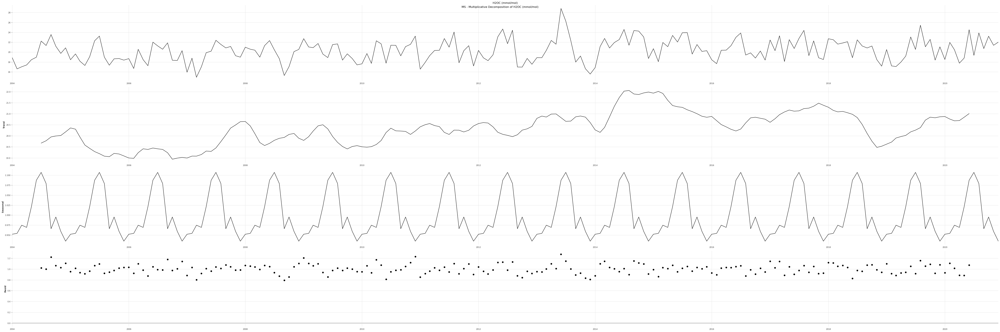

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


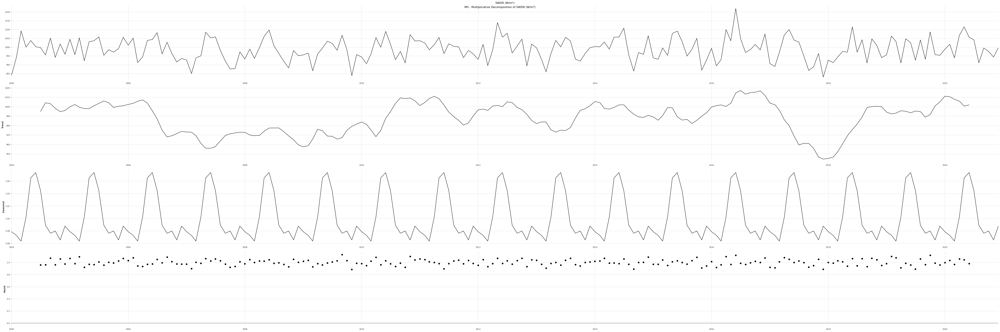

---------------------------------------------------------------------------------------------------------


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


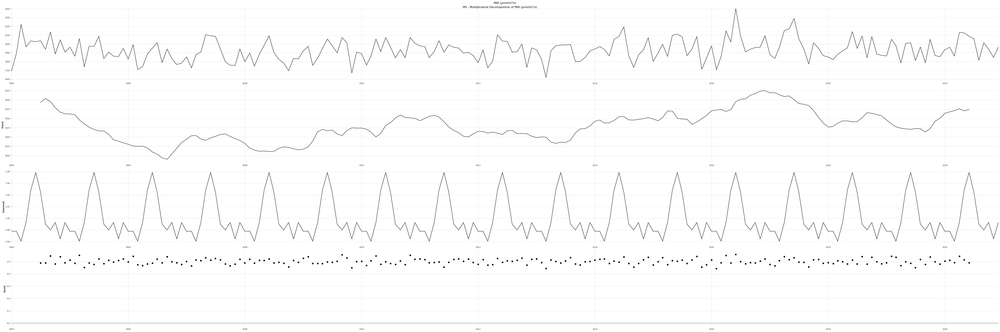

---------------------------------------------------------------------------------------------------------


In [59]:
multiplicative_seasonal_decomposition(df = df, freq = "MS", datetime_col = "Date Time")

In [60]:
aggregated_month_max.head()

,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-01,299.10,99.0,18.91,838.63,1691.12
1,2004-02-01,299.07,99.6,16.61,942.45,1895.75
2,2004-03-01,301.00,99.6,17.03,1092.15,2222.01
3,2004-04-01,302.96,99.4,17.40,1000.00,1967.18
4,2004-05-01,302.57,99.5,18.46,1037.42,2034.75


## Model Building

### Train Test Split

- For the initial forecasting models, we will be using the Temperature `Tpot (K)` column an forecasting just the Temperature value

In [28]:
aggregated_week_max = pd.read_csv("aggregated_week_max.csv")
show_df(aggregated_week_max.head(5))

,Date Time,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
0,2004-01-04,289.22,97.5,8.98,742.66,1471.04
1,2004-01-11,299.10,99.0,18.91,838.63,1691.12
2,2004-01-18,285.21,97.7,9.31,280.89,534.56
3,2004-01-25,278.27,98.6,6.55,401.61,764.09
4,2004-02-01,283.74,97.3,8.48,449.90,878.96


In [29]:
print(aggregated_week_max.shape)
print(aggregated_week_max["Date Time"].min())
print(aggregated_week_max["Date Time"].max())

(888, 6)

2004-01-04

2021-01-03


In [30]:
aggregated_week_max["Date Time"] = pd.to_datetime(aggregated_week_max["Date Time"])
aggregated_week_max.set_index('Date Time', inplace=True)
aggregated_week_max.head()

,Tpot (K),rh (%),H2OC (mmol/mol),SWDR (W/m²),PAR (µmol/m²/s)
Date Time,,,,,
2004-01-04,289.22,97.5,8.98,742.66,1471.04
2004-01-11,299.10,99.0,18.91,838.63,1691.12
2004-01-18,285.21,97.7,9.31,280.89,534.56
2004-01-25,278.27,98.6,6.55,401.61,764.09
2004-02-01,283.74,97.3,8.48,449.90,878.96


In [31]:
# input_df = aggregated_week_max[['Date Time', 'Tpot (K)']]
input_df = aggregated_week_max[["Tpot (K)"]]
print("Input DF Head")
show_df(input_df.head())
print("Input DF Tail")
show_df(input_df.tail())

Input DF Head


,Tpot (K)
Date Time,
2004-01-04,289.22
2004-01-11,299.10
2004-01-18,285.21
2004-01-25,278.27
2004-02-01,283.74


Input DF Tail


,Tpot (K)
Date Time,
2020-12-06,300.94
2020-12-13,306.34
2020-12-20,284.93
2020-12-27,288.75
2021-01-03,280.96


- Data is available from `2004 to 2020` (i.e.) `17 years = 888 observations`
- `train_len` : `16 years ~= 828 weeks`
- `test_len` : `Remaining 60 weeks`

In [32]:
train_len = 828
train = input_df[:train_len]
test = input_df[train_len:]
print("Training DF Shape: ", train.shape)
print("Test DF Shape: ", test.shape)

Training DF Shape:  (828, 1)

Test DF Shape:  (60, 1)


### 1. Seasonal Naive
- A method of forecasting that uses Data from previous season to forecast (or rather give the same value in this case) for the next season. 
- Example: to forecast for Jan of next year, we will be using the data of Jan from current year and say that the values of Jan (next year) will be the same as that of Jan (Current Year)

#### Plot Train, Test and Forecast

In [33]:
# Seasonal naive forecast

seasonal_naive_forecast = test.copy()
seasonal_naive_forecast["forecast"]= list(train['Tpot (K)'].tail(60))

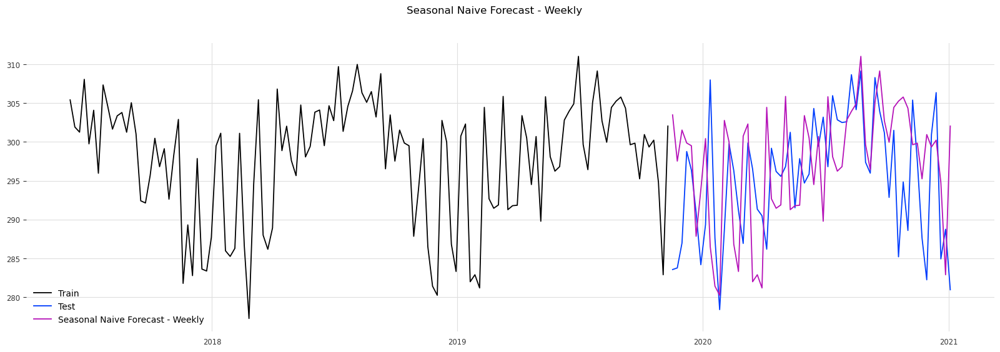

In [145]:
# Plot the forecast and actual values
plot_title = "Seasonal Naive Forecast - Weekly"
plt.figure(figsize=(20, 6))
plt.plot(train['Tpot (K)'][700:], label='Train')
plt.plot(test['Tpot (K)'], label='Test')
plt.plot(seasonal_naive_forecast["forecast"], label=plot_title)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.legend(loc='best')
plt.suptitle(plot_title) # add a title
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

#### Calculate the RMSE and MAPE to evaluate the forecasts

In [36]:
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],seasonal_naive_forecast['forecast'])).round(2)
mape = np.round(np.mean(np.abs(test['Tpot (K)']-seasonal_naive_forecast["forecast"])/test['Tpot (K)'])*100,2)
accuracy = 100-mape

results = pd.DataFrame({ 'Method': ['Seasonal Naive method' ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]

results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34


### 2. Holt's Winter Exponential Smoothing

- A method of forecasting algorithm that smooths a time series and accounts for its value, trend, and seasonality. It uses three parameters: one for level, one for trend, and one for seasonality.
- It assigns exponentially decreasing weights and values to historical data, and computes the combined effects of the three aspects of the time series behavior.

#### Plot Train, Test and Forecast

In [38]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [39]:
# Holt's Winter Exponential Additive

hwe_additive = test.copy()

model = ExponentialSmoothing(np.asarray(train['Tpot (K)']), seasonal_periods= 52, trend = "add", seasonal = "add")
model_fit = model.fit(optimized = True)
print(model_fit.params)
hwe_additive["forecast"]= model_fit.forecast(60)

{'smoothing_level': 1.4901161193847656e-08, 'smoothing_trend': 2.4975694852059524e-09, 'smoothing_seasonal': 0.5742548825923711, 'damping_trend': nan, 'initial_level': 294.6301017769795, 'initial_trend': 0.0029366539313762127, 'initial_seasons': array([ -9.01370831,   5.20020173,  -7.11028603, -14.15379539,

       -14.81817404,   3.66935749,   2.78812327, -15.05197287,

       -16.9999072 ,   1.69619066,   5.59781568,  -1.87073339,

        -7.74519488,  -6.43777046,   7.89750151,  -0.31010554,

         0.80321821,   2.54448142,   5.64172171,   4.16790583,

         1.65943132,   5.55044754,  -0.08036421,   7.02087908,

         4.36638495,   6.04137771,   3.54031932,   7.12144125,

         9.74761424,   9.84488484,   9.62312853,   4.17279681,

         5.48269681,   6.96715794,   3.37210363,   0.51541519,

         7.40823541,   2.17964677,  -0.93280493,  -2.77321081,

         7.64808251,  -4.02230865,  -0.38735145,  -0.98345913,

        -0.28927342,   6.28516638,  -9.55568778, -

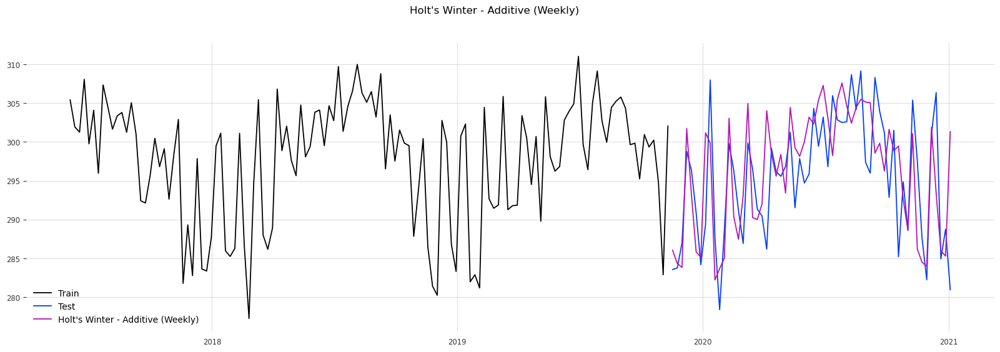

In [44]:
# Plot the forecast and actual values
plt.figure(figsize=(20, 6))
plot_title = "Holt's Winter - Additive (Weekly)"
plt.plot(train['Tpot (K)'][700:], label='Train')
plt.plot(test['Tpot (K)'], label='Test')
plt.plot(hwe_additive["forecast"], label=plot_title)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.legend(loc='best')
plt.suptitle(plot_title) # add a title
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

#### Calculate the RMSE and MAPE to evaluate the forecasts

In [41]:
rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],hwe_additive['forecast'])).round(2)
mape = np.round(np.mean(np.abs(test['Tpot (K)']-hwe_additive["forecast"])/test['Tpot (K)'])*100,2)
accuracy = 100-mape

temp_results = pd.DataFrame({ 'Method': ["Holt's Winter - Additive" ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
results = pd.concat([results, temp_results])
results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]

results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34
0,Holt's Winter - Additive,6.54,1.72,98.28


In [149]:
# Holt's Winter Exponential Multiplicative

hwe_multiplicative = test.copy()

model = ExponentialSmoothing(np.asarray(train['Tpot (K)']), seasonal_periods= 52, trend = "mul", seasonal = "mul")
model_fit = model.fit(optimized = True)
print(model_fit.params)
hwe_multiplicative["forecast"]= model_fit.forecast(60)

{'smoothing_level': 0.005, 'smoothing_trend': 0.0025, 'smoothing_seasonal': 0.5685714285714286, 'damping_trend': nan, 'initial_level': 294.6833846153844, 'initial_trend': 1.0000219804477126, 'initial_seasons': array([0.95154278, 1.01883388, 1.00185712, 0.96556098, 0.9404005 ,

       0.99191426, 1.01819881, 0.95618769, 0.959341  , 0.99599517,

       1.0170371 , 0.97616316, 0.97497249, 0.98338836, 1.01793633,

       0.99854694, 0.99744016, 1.00206952, 1.01112277, 1.01079199,

       1.00664748, 1.02388407, 1.00399564, 1.02575438, 1.02013696,

       1.0323061 , 1.01468488, 1.0255531 , 1.03593978, 1.04027543,

       1.03198089, 1.00366631, 1.02046558, 1.02239171, 1.01199311,

       0.99999624, 1.02573892, 1.00679043, 1.00454073, 0.99854277,

       1.02456626, 0.99453953, 0.99684052, 0.99247973, 0.99213753,

       1.02360846, 0.96628123, 0.96044983, 0.96998164, 1.02353183,

       0.96431313, 0.9466848 ]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


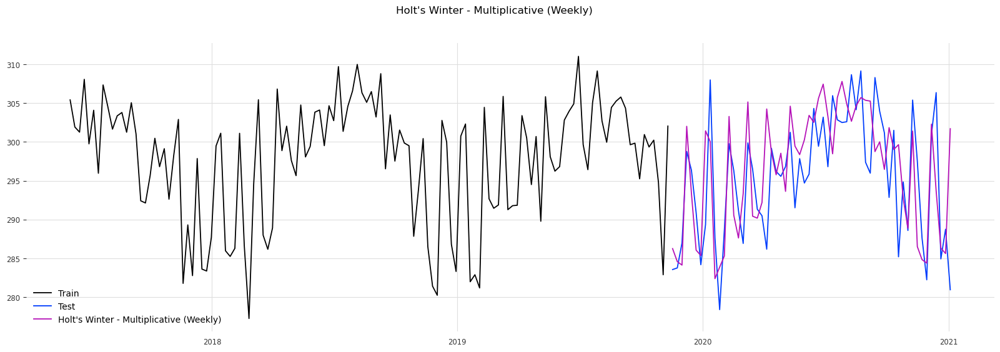

In [150]:
# Plot the forecast and actual values
plt.figure(figsize=(20, 6))
plot_title = "Holt's Winter - Multiplicative (Weekly)"
plt.plot(train['Tpot (K)'][700:], label='Train')
plt.plot(test['Tpot (K)'], label='Test')
plt.plot(hwe_multiplicative["forecast"], label=plot_title)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.legend(loc='best')
plt.suptitle(plot_title) # add a title
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

In [151]:
#### Calculate the RMSE and MAPE to evaluate the forecasts

rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],hwe_multiplicative['forecast'])).round(2)
mape = np.round(np.mean(np.abs(test['Tpot (K)']-hwe_multiplicative["forecast"])/test['Tpot (K)'])*100,2)
accuracy = 100-mape

temp_results = pd.DataFrame({ 'Method': ["Holt's Winter - Multiplicative" ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
results = pd.concat([results, temp_results])
results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]

results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34
0,Holt's Winter - Additive,6.54,1.72,98.28
0,Auto Regressive lags_2,7.87,2.22,97.78
0,Auto Regressive lags_3,7.83,2.21,97.79
0,Auto Regressive lags_4,7.63,2.12,97.88
0,Auto Regressive lags_5,7.67,2.15,97.85
0,Auto Regressive lags_6,7.48,2.10,97.90
0,Auto Regressive lags_7,7.45,2.10,97.90
0,Auto Regressive lags_8,7.46,2.09,97.91
0,Auto Regressive lags_9,7.45,2.09,97.91


### Using AR, MA, ARMA, ARIMA, SARIMA and SARIMAX models

Prerequisites

Stationarity: The foremost prerequisite for an AR model is stationarity. A stationary time series is one whose properties do not depend on the time at which the series is observed, indicating that the series has constant mean and variance over time.

Lag selection: Autocorrelation and partial autocorrelation plots can be used to identify the appropriate number of lags to be included in the AR model.

In [54]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [47]:
# Perform ADF test
result = adfuller(aggregated_week_max['Tpot (K)'])
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')


ADF Statistic: -11.835166056081922

p-value: 7.821983129565585e-22


In [48]:
# If data is non-stationary, apply differencing
if result[1] > 0.05:
    print("Data is not Stationary")
else:
    print("Data is Stationary")
#     data['Tpot (K)'] = data['Tpot (K)'].diff().dropna()

Data is Stationary


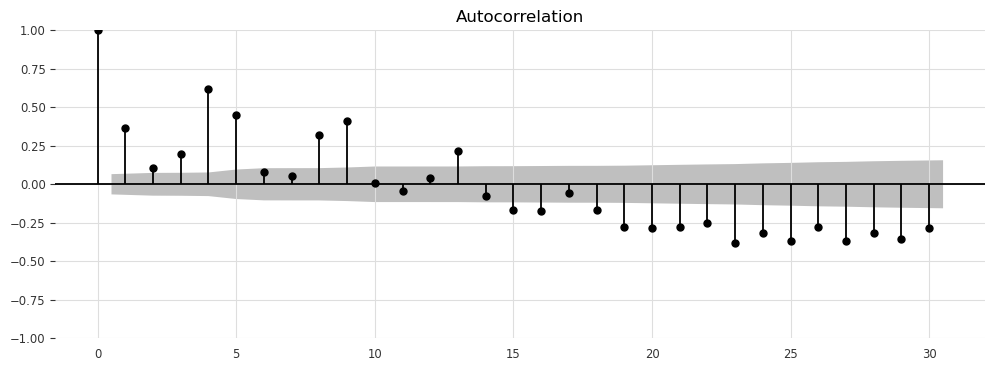

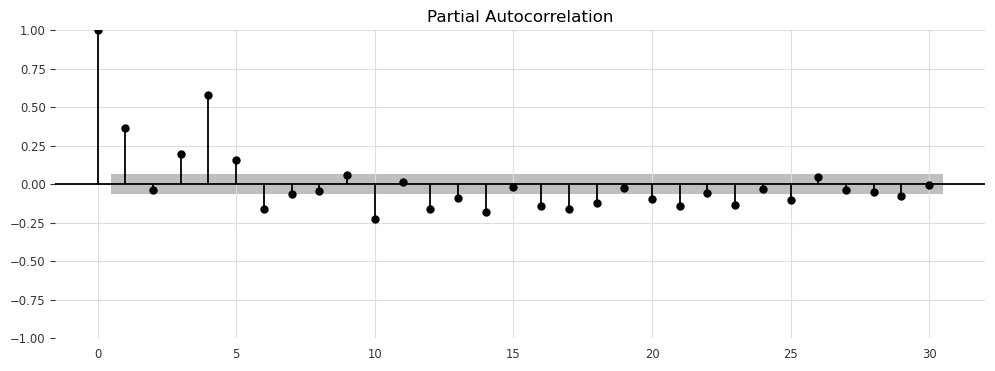

In [72]:
# Plot ACF
plt.figure(figsize=(12,4))
plot_title = "Autocorrelation (ACF) plot"
plot_acf(aggregated_week_max['Tpot (K)'], ax=plt.gca(), lags = 30)
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

# Plot PACF
plt.figure(figsize=(12,4))
plot_title = "Partial Autocorrelation (PACF) plot"
plot_pacf(aggregated_week_max['Tpot (K)'], ax=plt.gca(), lags = 30)
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

#### Implement Auto Regression Model

- For the AR model, we need to look at the `PACF plot` to determine the `p` value to be used for lags.
- Looking at the above `PACF Plot` the PACF value at lag 3 goes below the confidence level, hence we can deduce that `Lag=2` is a good value.
- However, this is just an initial estimator and we will be iterating through various lag values 2 thru 10 and analyse accuracy.

#### Implement AR Model

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(2)   Log Likelihood               -2843.622

Method:               Conditional MLE   S.D. of innovations              7.566

Date:                Wed, 26 Jul 2023   AIC                           5695.243

Time:                        19:48:21   BIC                           5714.109

Sample:                    01-18-2004   HQIC                          5702.480

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const         193.4586     11.552     16.747      0.000     170.818     216.099

Tpot (K).L1     0.3828      0.035     10.998      0.000       0.315       0.451

Tpot (K).L2    -0.0373      0.035 

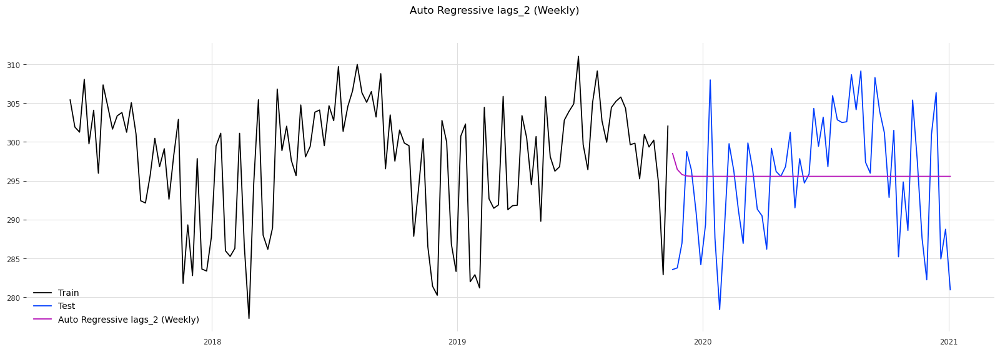

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(3)   Log Likelihood               -2821.927

Method:               Conditional MLE   S.D. of innovations              7.401

Date:                Wed, 26 Jul 2023   AIC                           5653.853

Time:                        19:48:22   BIC                           5677.430

Sample:                    01-25-2004   HQIC                          5662.897

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const         154.2365     13.077     11.794      0.000     128.605     179.868

Tpot (K).L1     0.3920      0.034     11.504      0.000       0.325       0.459

Tpot (K).L2    -0.1178      0.037 

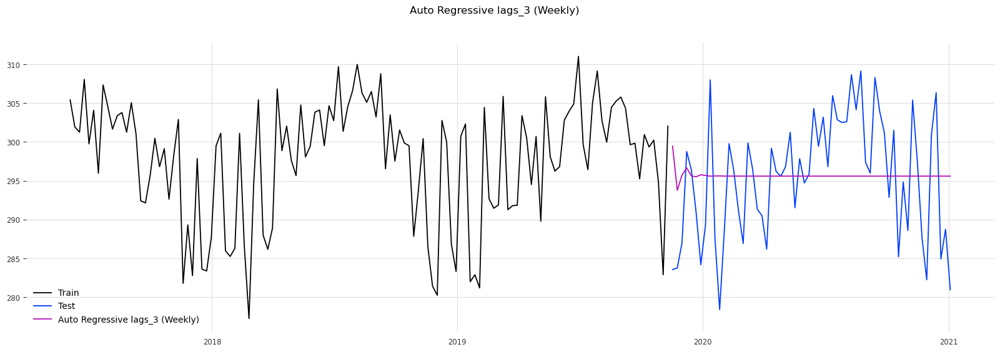

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(4)   Log Likelihood               -2641.697

Method:               Conditional MLE   S.D. of innovations              5.972

Date:                Wed, 26 Jul 2023   AIC                           5295.394

Time:                        19:48:24   BIC                           5323.679

Sample:                    02-01-2004   HQIC                          5306.244

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          64.4455     11.407      5.650      0.000      42.088      86.803

Tpot (K).L1     0.2694      0.028      9.578      0.000       0.214       0.325

Tpot (K).L2    -0.0471      0.030 

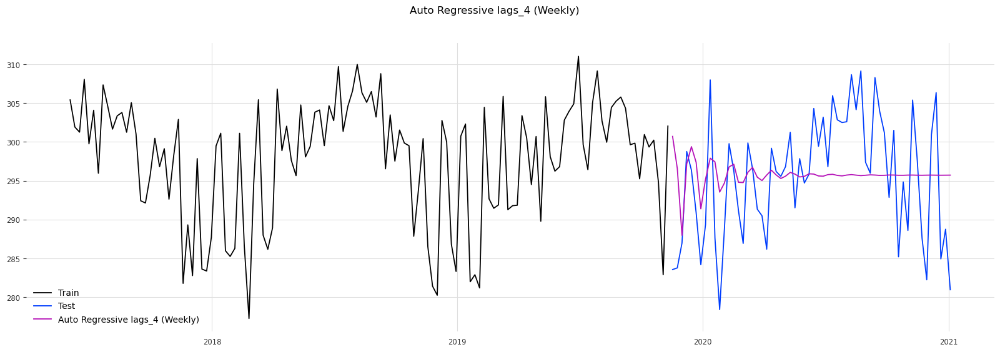

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(5)   Log Likelihood               -2629.099

Method:               Conditional MLE   S.D. of innovations              5.904

Date:                Wed, 26 Jul 2023   AIC                           5272.198

Time:                        19:48:27   BIC                           5305.189

Sample:                    02-08-2004   HQIC                          5284.854

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          55.3695     11.494      4.817      0.000      32.842      77.897

Tpot (K).L1     0.1784      0.034      5.175      0.000       0.111       0.246

Tpot (K).L2    -0.0435      0.029 

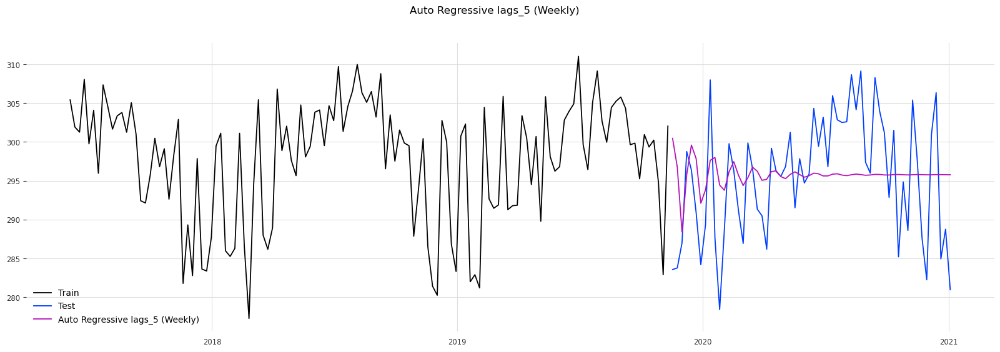

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(6)   Log Likelihood               -2614.908

Method:               Conditional MLE   S.D. of innovations              5.825

Date:                Wed, 26 Jul 2023   AIC                           5245.815

Time:                        19:48:29   BIC                           5283.509

Sample:                    02-15-2004   HQIC                          5260.277

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          63.5734     11.500      5.528      0.000      41.033      86.113

Tpot (K).L1     0.2036      0.034      5.916      0.000       0.136       0.271

Tpot (K).L2     0.0485      0.035 

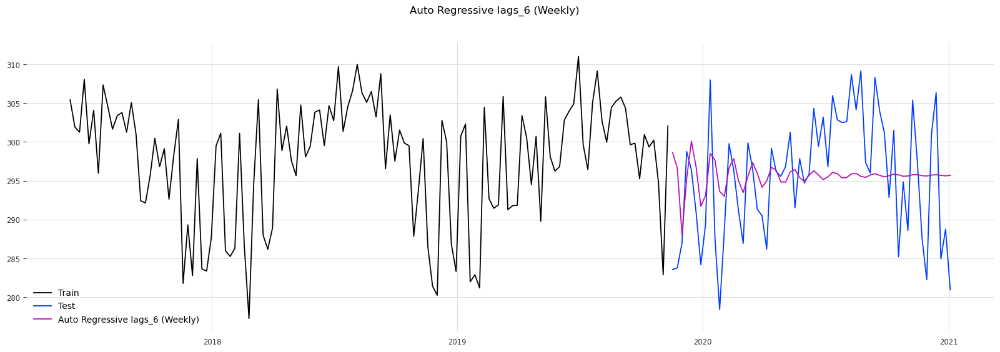

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(7)   Log Likelihood               -2610.054

Method:               Conditional MLE   S.D. of innovations              5.813

Date:                Wed, 26 Jul 2023   AIC                           5238.108

Time:                        19:48:31   BIC                           5280.502

Sample:                    02-22-2004   HQIC                          5254.374

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          67.1636     11.689      5.746      0.000      44.254      90.073

Tpot (K).L1     0.1920      0.035      5.511      0.000       0.124       0.260

Tpot (K).L2     0.0613      0.035 

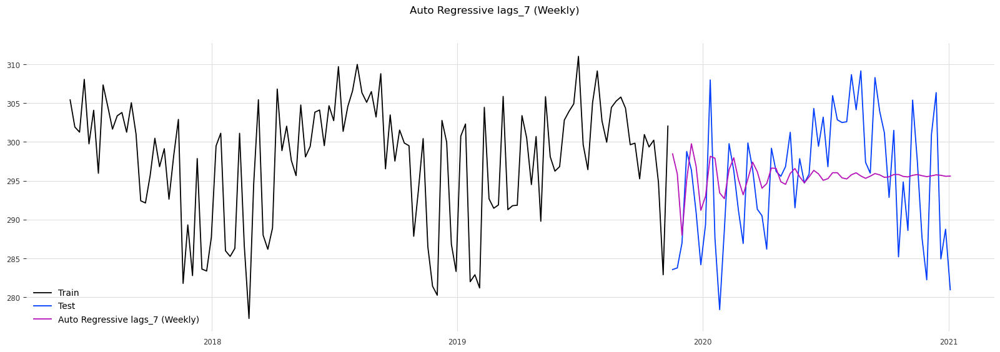

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(8)   Log Likelihood               -2605.976

Method:               Conditional MLE   S.D. of innovations              5.807

Date:                Wed, 26 Jul 2023   AIC                           5231.952

Time:                        19:48:33   BIC                           5279.045

Sample:                    02-29-2004   HQIC                          5250.022

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          70.7243     11.909      5.939      0.000      47.383      94.066

Tpot (K).L1     0.1899      0.035      5.444      0.000       0.122       0.258

Tpot (K).L2     0.0549      0.036 

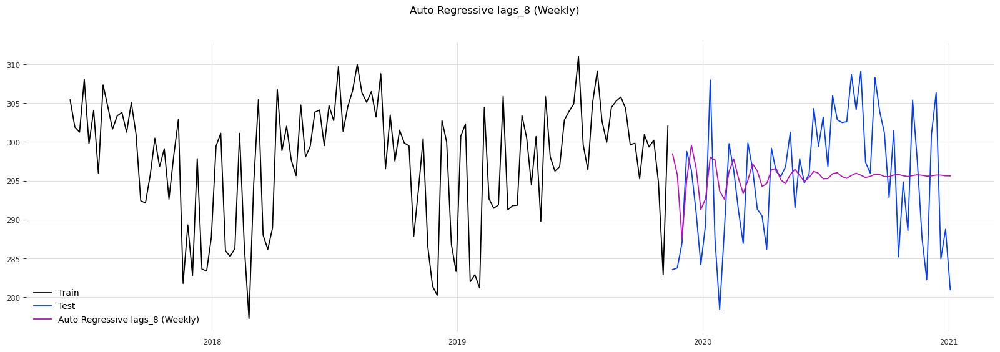

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                     AutoReg(9)   Log Likelihood               -2601.087

Method:               Conditional MLE   S.D. of innovations              5.795

Date:                Wed, 26 Jul 2023   AIC                           5224.173

Time:                        19:48:36   BIC                           5275.962

Sample:                    03-07-2004   HQIC                          5244.046

                         - 11-10-2019                                         


                  coef    std err          z      P>|z|      [0.025      0.975]

-------------------------------------------------------------------------------

const          67.2825     12.138      5.543      0.000      43.493      91.072

Tpot (K).L1     0.1912      0.035      5.484      0.000       0.123       0.260

Tpot (K).L2     0.0599      0.036 

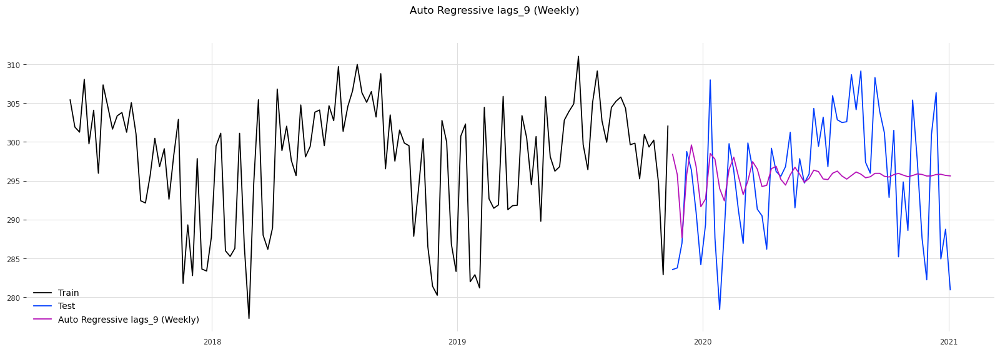

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                    AutoReg(10)   Log Likelihood               -2579.917

Method:               Conditional MLE   S.D. of innovations              5.669

Date:                Wed, 26 Jul 2023   AIC                           5183.835

Time:                        19:48:37   BIC                           5240.317

Sample:                    03-14-2004   HQIC                          5205.510

                         - 11-10-2019                                         


                   coef    std err          z      P>|z|      [0.025      0.975]

--------------------------------------------------------------------------------

const           80.6301     12.095      6.666      0.000      56.924     104.337

Tpot (K).L1      0.2042      0.034      5.969      0.000       0.137       0.271

Tpot (K).L2      0.0485      0

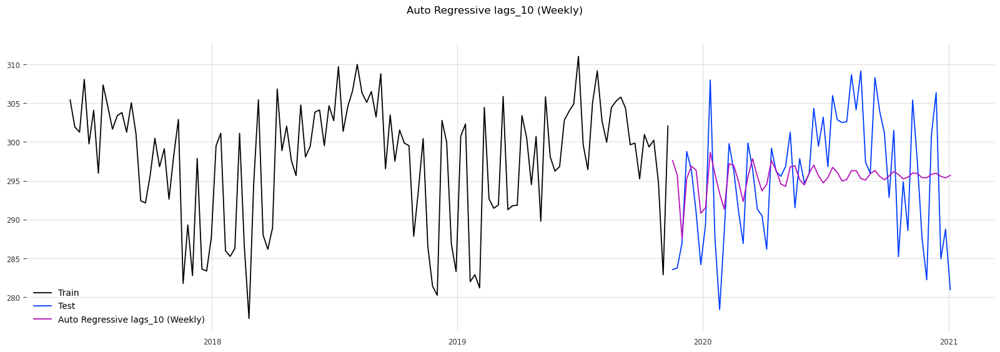

                            AutoReg Model Results                             


Dep. Variable:               Tpot (K)   No. Observations:                  828

Model:                    AutoReg(11)   Log Likelihood               -2577.175

Method:               Conditional MLE   S.D. of innovations              5.672

Date:                Wed, 26 Jul 2023   AIC                           5180.350

Time:                        19:48:39   BIC                           5241.524

Sample:                    03-21-2004   HQIC                          5203.827

                         - 11-10-2019                                         


                   coef    std err          z      P>|z|      [0.025      0.975]

--------------------------------------------------------------------------------

const           79.6276     12.430      6.406      0.000      55.265     103.991

Tpot (K).L1      0.2062      0.035      5.888      0.000       0.138       0.275

Tpot (K).L2      0.0479      0

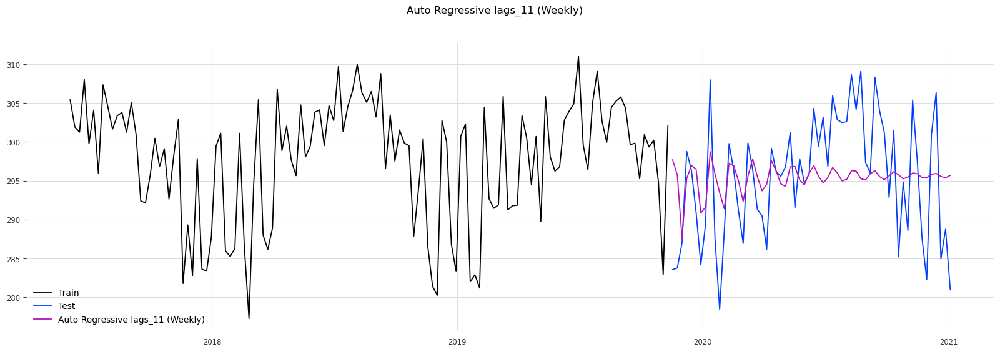

In [76]:
# Implement AR Model

auto_regressive = test.copy()

for each in range(2, 12):
    model = AutoReg(train['Tpot (K)'], lags=each)
    model_fit = model.fit()
    # Summary of the model
    print(model_fit.summary())
    
    # Generating and Plotting the forecast
    colname = "forecast_lags_{}".format(each) 
    auto_regressive[colname]= model_fit.forecast(60)
    
    # Plot the forecast and actual values
    plt.figure(figsize=(20, 6))
    plot_title = "Auto Regressive lags_{} (Weekly)".format(each)
    plt.plot(train['Tpot (K)'][700:], label='Train')
    plt.plot(test['Tpot (K)'], label='Test')
    plt.plot(auto_regressive[colname], label=plot_title)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.legend(loc='best')
    plt.suptitle(plot_title) # add a title
    plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
    plt.show(block = False)
    
    # Calculate the RMSE and MAPE to evaluate the forecasts
    rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],auto_regressive[colname])).round(2)
    mape = np.round(np.mean(np.abs(test['Tpot (K)']-auto_regressive[colname])/test['Tpot (K)'])*100,2)
    accuracy = 100-mape

    temp_results = pd.DataFrame({ 'Method': ["Auto Regressive lags_{}".format(each) ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
    results = pd.concat([results, temp_results])
    results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]
    

In [77]:
results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34
0,Holt's Winter - Additive,6.54,1.72,98.28
0,Auto Regressive lags_2,7.87,2.22,97.78
0,Auto Regressive lags_3,7.83,2.21,97.79
0,Auto Regressive lags_4,7.63,2.12,97.88
0,Auto Regressive lags_5,7.67,2.15,97.85
0,Auto Regressive lags_6,7.48,2.10,97.90
0,Auto Regressive lags_7,7.45,2.10,97.90
0,Auto Regressive lags_8,7.46,2.09,97.91
0,Auto Regressive lags_9,7.45,2.09,97.91


#### Implement ARIMA Model

In [109]:
from statsmodels.tsa.arima.model import ARIMA

arima = test.copy()
model = ARIMA(train['Tpot (K)'], order=(2,1,6))
model_fit = model.fit()
print(model_fit.params)

ar.L1      0.224522

ar.L2     -0.886456

ma.L1     -1.001189

ma.L2      0.967735

ma.L3     -0.691304

ma.L4      0.382549

ma.L5     -0.169843

ma.L6      0.075172

sigma2    35.151267

dtype: float64


#### forecast

In [110]:
arima["forecast"] = model_fit.predict(arima.index.min(), arima.index.max())

In [111]:
type(arima)
show_df(arima.head())

,Tpot (K),forecast
Date Time,,
2019-11-17,283.56,298.472343
2019-11-24,283.77,295.834513
2019-12-01,286.98,288.899019
2019-12-08,298.76,294.403958
2019-12-15,296.36,299.597066


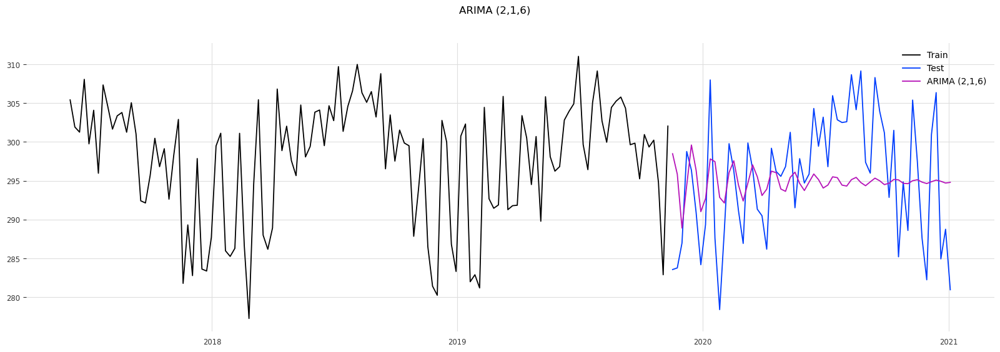

In [116]:
# Plot the forecast and actual values
plt.figure(figsize=(20, 6))
plot_title = "ARIMA (2,1,6)"
plt.plot(train['Tpot (K)'][700:], label='Train')
plt.plot(test['Tpot (K)'], label='Test')
plt.plot(arima["forecast"], label=plot_title)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.legend(loc='best')
plt.suptitle(plot_title) # add a title
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

#### Calculate the RMSE and MAPE to evaluate the forecasts

In [103]:
rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],arima['forecast'])).round(2)
mape = np.round(np.mean(np.abs(test['Tpot (K)']-arima["forecast"])/test['Tpot (K)'])*100,2)
accuracy = 100-mape

temp_results = pd.DataFrame({ 'Method': ["ARIMA (2,1,6)" ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
results = pd.concat([results, temp_results])
results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]

results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34
0,Holt's Winter - Additive,6.54,1.72,98.28
0,Auto Regressive lags_2,7.87,2.22,97.78
0,Auto Regressive lags_3,7.83,2.21,97.79
0,Auto Regressive lags_4,7.63,2.12,97.88
0,Auto Regressive lags_5,7.67,2.15,97.85
0,Auto Regressive lags_6,7.48,2.10,97.90
0,Auto Regressive lags_7,7.45,2.10,97.90
0,Auto Regressive lags_8,7.46,2.09,97.91
0,Auto Regressive lags_9,7.45,2.09,97.91


### Seasonal auto regressive integrated moving average (SARIMA)

In [113]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima = test.copy()
model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 52)) 
model_fit = model.fit()
print(model_fit.params)

ar.L1        0.025532

ma.L1       -0.999960

ar.S.L52    -0.205307

ma.S.L52    -0.208317

sigma2      28.488563

dtype: float64


In [114]:
sarima["forecast"] = model_fit.predict(sarima.index.min(), sarima.index.max())

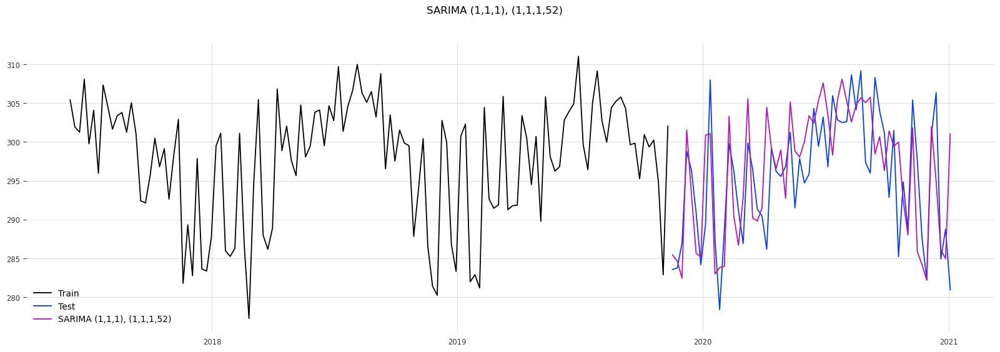

In [117]:
# Plot the forecast and actual values
plt.figure(figsize=(20, 6))
plot_title = "SARIMA (1,1,1), (1,1,1,52)"
plt.plot(train['Tpot (K)'][700:], label='Train')
plt.plot(test['Tpot (K)'], label='Test')
plt.plot(sarima["forecast"], label=plot_title)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.legend(loc='best')
plt.suptitle(plot_title) # add a title
plt.savefig("{}.png".format(plot_title.replace("/", " per ").replace("**", "^"))) # save the figure
plt.show(block = False)

In [118]:
rmse = np.sqrt(mean_squared_error(test['Tpot (K)'],sarima['forecast'])).round(2)
mape = np.round(np.mean(np.abs(test['Tpot (K)']-sarima["forecast"])/test['Tpot (K)'])*100,2)
accuracy = 100-mape

temp_results = pd.DataFrame({ 'Method': ["SARIMA (1,1,1), (1,1,1,52)" ], 'MAPE': [mape], 'RMSE': [rmse], "Accuracy" : [accuracy]})
results = pd.concat([results, temp_results])
results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]

results

,Method,RMSE,MAPE,Accuracy
0,Seasonal Naive method,9.69,2.66,97.34
0,Holt's Winter - Additive,6.54,1.72,98.28
0,Auto Regressive lags_2,7.87,2.22,97.78
0,Auto Regressive lags_3,7.83,2.21,97.79
0,Auto Regressive lags_4,7.63,2.12,97.88
0,Auto Regressive lags_5,7.67,2.15,97.85
0,Auto Regressive lags_6,7.48,2.10,97.90
0,Auto Regressive lags_7,7.45,2.10,97.90
0,Auto Regressive lags_8,7.46,2.09,97.91
0,Auto Regressive lags_9,7.45,2.09,97.91


### Seasonal auto regressive integrated moving average (SARIMA) - With Grid Search

In [135]:
# Define the grid of hyperparameters to search over
p_values = np.arange(1, 5)
d_values = np.arange(1, 2)
q_values = np.arange(1, 5)
P_values = np.arange(1, 5)
D_values = np.arange(1, 2)
Q_values = np.arange(1, 5)
m = 52

# Create a grid of hyperparameter combinations
hyperparameter_grid = []
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        hyperparameter_grid.append((p, d, q, P, D, Q, m))
                        
                        
                        
# hyperparameter_grid

for hyperparameters in hyperparameter_grid:
    print("HyperParameters: ", hyperparameters)
    order=hyperparameters[:3]
    print("Order: ",order)
    seasonal_order=hyperparameters[-4:]
    print("Seasonal_Order: ",seasonal_order)
    
    

HyperParameters:  (1, 1, 1, 1, 1, 1, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (1, 1, 1, 52)

HyperParameters:  (1, 1, 1, 1, 1, 2, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (1, 1, 2, 52)

HyperParameters:  (1, 1, 1, 1, 1, 3, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (1, 1, 3, 52)

HyperParameters:  (1, 1, 1, 1, 1, 4, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (1, 1, 4, 52)

HyperParameters:  (1, 1, 1, 2, 1, 1, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (2, 1, 1, 52)

HyperParameters:  (1, 1, 1, 2, 1, 2, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (2, 1, 2, 52)

HyperParameters:  (1, 1, 1, 2, 1, 3, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (2, 1, 3, 52)

HyperParameters:  (1, 1, 1, 2, 1, 4, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (2, 1, 4, 52)

HyperParameters:  (1, 1, 1, 3, 1, 1, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (3, 1, 1, 52)

HyperParameters:  (1, 1, 1, 3, 1, 2, 52)

Order:  (1, 1, 1)

Seasonal_Order:  (3, 1, 2, 52)

HyperParameters:  (1, 1, 1, 3, 1, 3, 52)

Order:  (1, 1, 1)

Seasonal_

In [140]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

y = train.copy(deep= True)
y_test = test.copy(deep=True)

# Define the grid of hyperparameters to search over
p_values = np.arange(1, 5)
d_values = np.arange(1, 2)
q_values = np.arange(1, 5)
P_values = np.arange(1, 5)
D_values = np.arange(1, 2)
Q_values = np.arange(1, 5)
m = 52

# Create a grid of hyperparameter combinations
hyperparameter_grid = []
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        hyperparameter_grid.append((p, d, q, P, D, Q, m))

# Fit a SARIMA model for each hyperparameter combination

mape_results = []
for hyperparameters in hyperparameter_grid:
    sarimax_model = SARIMAX(y, order=hyperparameters[:3], seasonal_order=hyperparameters[-4:],
                            enforce_stationarity=False, enforce_invertibility=False)
    print("HyperParameters: ", hyperparameters)
    print("Order: ",order)
    print("Seasonal_Order: ",seasonal_order)
    model_fit = sarimax_model.fit()
    y_test["forecast"] = model_fit.predict(y_test.index.min(), y_test.index.max())
#     mape = np.round(np.mean(np.abs( - y_test) / y_test)*100,2)
    mape = np.round(np.mean(np.abs(y_test['Tpot (K)']-y_test["forecast"])/y_test['Tpot (K)'])*100,2)
    print("Mape: ", mape)
    mape_results.append((hyperparameters, mape))

# Select the hyperparameter combination with the best model performance
best_hyperparameters = min(mape_results, key=lambda x: x[1])[0]


HyperParameters:  (1, 1, 1, 1, 1, 1, 52)

Order:  (4, 1, 4)

Seasonal_Order:  (4, 1, 4, 52)

Mape:  1.74

HyperParameters:  (1, 1, 1, 1, 1, 2, 52)

Order:  (4, 1, 4)

Seasonal_Order:  (4, 1, 4, 52)

Mape:  1.71

HyperParameters:  (1, 1, 1, 1, 1, 3, 52)

Order:  (4, 1, 4)

Seasonal_Order:  (4, 1, 4, 52)

Mape:  1.71

HyperParameters:  (1, 1, 1, 1, 1, 4, 52)

Order:  (4, 1, 4)

Seasonal_Order:  (4, 1, 4, 52)


KeyboardInterrupt: 

### DarTS

In [143]:
show_df(train)

,Tpot (K)
Date Time,
2004-01-04,289.22
2004-01-11,299.10
2004-01-18,285.21
2004-01-25,278.27
2004-02-01,283.74
...,...
2019-10-13,299.34
2019-10-20,300.22
2019-10-27,294.76


In [142]:
show_df(test)

,Tpot (K)
Date Time,
2019-11-17,283.56
2019-11-24,283.77
2019-12-01,286.98
2019-12-08,298.76
2019-12-15,296.36
2019-12-22,290.90
2019-12-29,284.18
2020-01-05,289.36
2020-01-12,307.97


### FB-Prophet Univariate

The Prophet library requires that the input Pandas DF has a date column named as `DS` and the train / prediction value column as `Y`

In [48]:
prophet_input = aggregated_month_max[["Date Time","T (degC)"]]
prophet_input.columns = ["ds", "y"]
show_df(prophet_input)

,ds,y
0,2004-01-01,25.13
1,2004-02-01,24.98
2,2004-03-01,26.49
3,2004-04-01,28.57
4,2004-05-01,28.19
...,...,...
199,2020-08-01,34.80
200,2020-09-01,34.18
201,2020-10-01,26.71
202,2020-11-01,31.42


In [49]:
prophet_train = train.copy()
prophet_train.columns = ["ds", "y"]
show_df(prophet_train.head())
show_df(prophet_train.tail())

,ds,y
0,2004-01-01,25.13
1,2004-02-01,24.98
2,2004-03-01,26.49
3,2004-04-01,28.57
4,2004-05-01,28.19


,ds,y
187,2019-08-01,31.37
188,2019-09-01,29.76
189,2019-10-01,26.46
190,2019-11-01,27.72
191,2019-12-01,24.13


In [50]:
prophet_test = test.copy()
prophet_test.columns = ["ds", "y"]
show_df(prophet_test.head())
show_df(prophet_test.tail())

,ds,y
192,2020-01-01,33.61
193,2020-02-01,25.19
194,2020-03-01,24.82
195,2020-04-01,25.56
196,2020-05-01,27.31


,ds,y
199,2020-08-01,34.80
200,2020-09-01,34.18
201,2020-10-01,26.71
202,2020-11-01,31.42
203,2020-12-01,32.26


In [51]:
import itertools
# Prophet hyper param optimization
param_grid = {'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5], 'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0]}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = [] # Store the RMSEs for each params here

In [52]:
# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(prophet_train) # Fit model with given params
    df_cv = cross_validation(m, horizon='12 months', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

15:18:49 - cmdstanpy - INFO - Chain [1] start processing

15:18:52 - cmdstanpy - INFO - Chain [1] done processing

15:18:52 - cmdstanpy - ERROR - Chain [1] error: terminated by signal 3221225657 

Optimization terminated abnormally. Falling back to Newton.

15:18:52 - cmdstanpy - INFO - Chain [1] start processing

15:18:53 - cmdstanpy - INFO - Chain [1] done processing

15:18:53 - cmdstanpy - ERROR - Chain [1] error: terminated by signal 3221225657 


RuntimeError: Error during optimization! Command 'C:\Users\614074329\Anaconda3\envs\Thesis\Lib\site-packages\prophet\stan_model\prophet_model.bin random seed=82407 data file=C:\Users\614074~1\AppData\Local\Temp\tmpjtncj81u\_k4kv4_b.json init=C:\Users\614074~1\AppData\Local\Temp\tmpjtncj81u\rk8y26de.json output file=C:\Users\614074~1\AppData\Local\Temp\tmpjtncj81u\prophet_model6f2hq7e0\prophet_model-20230714151852.csv method=optimize algorithm=newton iter=10000' failed: 

In [ ]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

In [ ]:
# Train / Fit

# %%time

model = Prophet(changepoint_prior_scale=0.001,
               seasonality_prior_scale = 0.01)  

#model = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale=0.5)  
#model = Prophet(yearly_seasonality=True, seasonality_mode='multiplicative')  
model.fit(prophet_train) # fit the model with the dataframe
print('Prophet is trained')